In [1]:
import os
import pandas as pd
from PIL import Image
from tqdm import tqdm
from pathlib import Path
import pickle
import torch
import clip
import numpy as np
from transformers import CLIPProcessor, CLIPModel
from sentence_transformers import SentenceTransformer, util

In [2]:
# Choose computation device
device = "cuda:0" if torch.cuda.is_available() else "cpu" 

# Load pre-trained CLIP model
model, preprocess = clip.load("ViT-B/32", device=device, jit=False)
model.cuda().eval()

CLIP(
  (visual): VisionTransformer(
    (conv1): Conv2d(3, 768, kernel_size=(32, 32), stride=(32, 32), bias=False)
    (ln_pre): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
    (transformer): Transformer(
      (resblocks): Sequential(
        (0): ResidualAttentionBlock(
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
          )
          (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): Sequential(
            (c_fc): Linear(in_features=768, out_features=3072, bias=True)
            (gelu): QuickGELU()
            (c_proj): Linear(in_features=3072, out_features=768, bias=True)
          )
          (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        )
        (1): ResidualAttentionBlock(
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
          

In [3]:
path_data = '/'  # Base path for images

# Load the CSV file
data_unfiltered = pd.read_csv("/".join([path_data, "images_v2.csv"]))

In [4]:
len(data_unfiltered)

38479

## Remove subjective topics

In [5]:
subjective_topics = ['Favorite home decorations', 'Favourite item in kitchen', 'Favourite sports clubs', 'How the most loved item is used', 'icons', 'Idols', 'Latest furniture bought', ' looking over the shoulder', 'Most loved item', 'Most loved toy', 'Most played songs on the radio', 'Music idol', 'Next big thing you are planning to buy', 'Playing with most loved toy', 'Thing I dream about having', 'Things I wish I had', 'Using most loved item', 'Youth culture', 'What I wish I could buy']

In [6]:
unique_topics = data_unfiltered['topics'].unique()

In [7]:
Subjective_topic_list = []

for topic in unique_topics:
    topic_ = topic.replace('/ ', ', ')
    topic_split = topic_.split(',')
    for split in topic_split:
        if split in subjective_topics:
            Subjective_topic_list.append(topic)

In [8]:
data = data_unfiltered[~data_unfiltered['topics'].isin(Subjective_topic_list)]
display(data)

,id,country.name,country.id,region.id,type,imageRelPath,topics,place,income
1,5d4bf31ccf0b3a0f3f359814,Burundi,bi,af,image,assets/5d4bf31ccf0b3a0f3f359814/5d4bf31ccf0b3a...,Family snapshots,butoyi,26.994581
2,5d4bf31ccf0b3a0f3f35982a,Burundi,bi,af,image,assets/5d4bf31ccf0b3a0f3f35982a/5d4bf31ccf0b3a...,Cutlery,butoyi,26.994581
3,5d4bf31ccf0b3a0f3f35982e,Burundi,bi,af,image,assets/5d4bf31ccf0b3a0f3f35982e/5d4bf31ccf0b3a...,Family,butoyi,26.994581
4,5d4bf31ccf0b3a0f3f359830,Burundi,bi,af,image,assets/5d4bf31ccf0b3a0f3f359830/5d4bf31ccf0b3a...,Place where eating dinner,butoyi,26.994581
5,5d4bf31dcf0b3a0f3f35983c,Burundi,bi,af,image,assets/5d4bf31dcf0b3a0f3f35983c/5d4bf31dcf0b3a...,Plate of food,butoyi,26.994581
...,...,...,...,...,...,...,...,...,...
38474,5ec4f5513f62767d97a47324,France,fr,eu,image,assets/5ec4f5513f62767d97a47324/5ec4f5513f6276...,Bed,larriere,19671.000000
38475,5ec4f5513f62767d97a47325,France,fr,eu,image,assets/5ec4f5513f62767d97a47325/5ec4f5513f6276...,Bathroom/Toilet,larriere,19671.000000
38476,5ec4f5523f62767d97a47327,France,fr,eu,image,assets/5ec4f5523f62767d97a47327/5ec4f5523f6276...,Armchair,larriere,19671.000000
38477,5ec4f5523f62767d97a47328,France,fr,eu,image,assets/5ec4f5523f62767d97a47328/5ec4f5523f6276...,Armchair,larriere,19671.000000


In [9]:
len(data)

36754

In [91]:
data.to_csv('clean_data.csv')

## Split topics

In [10]:
from collections import Counter
list_topics = list(data['topics'])


separate_topics = [t.lower().strip() for topic in list_topics for t in topic.split(",") ]


print(len(separate_topics))
#print(Counter(separate_topics))
set_topics = list(set(separate_topics))
print(len(set_topics))

45692
270


In [11]:
# map each topic to list of corresponding images
dict_topic2img = {}
for list_topics, image_path in zip(data['topics'], data['imageRelPath']):
    for topic in list_topics.split(","):
        topic = topic.lower().strip()
        if topic not in dict_topic2img:
            dict_topic2img[topic] = set() #### here a set was used in place of list to avoid duplicate where keyword appears twice in a topic
        dict_topic2img[topic].add(image_path)

print(len(dict_topic2img))

270


In [12]:
ground_truth_counts = [len(dict_topic2img[i]) for i in dict_topic2img]
print(sum(ground_truth_counts))

45616


In [17]:
topics = dict_topic2img.keys()

## Map topics to generated functions

In [13]:
with open("mapping_topic2function.pkl", 'rb') as f:
    topic2function = pickle.load(f)

In [45]:
#topic2function

In [38]:
topic_list = [i for i in topic2function.keys()]
function_list = [i for i in topic2function.values()]

In [42]:
len(function_list)

270

In [48]:
# gen_functions = [topic2function[i.lower()] for i in list(data['topics'])]
# len(gen_functions)

In [40]:
functions = [' '.join(function.split(' ')[5 :]) for function in function_list]
function_topic = [f"the {clean_id} represents {function}" for clean_id, function in zip(topic_list, functions)]

topic2function_topic = {}
for topic, function_topic in zip(topic_list, function_topic):
    topic2function_topic[topic] = function_topic

#### Use function as prompt

In [18]:
# function map
dict_function2imgGT = {}

for topic in topics:
    key = topic2function[topic]
    dict_function2imgGT[key] = dict_topic2img[topic]
print(len(dict_function2imgGT))

270


#### Use function-topic as prompt

In [101]:
#function_topic map
# dict_function2imgGT = {}

# for topic in topics:
#     key = topic2function_topic[topic]
#     dict_function2imgGT[key] = dict_topic2img[topic]
# print(len(dict_function2imgGT))

#### Use topic as prompt

In [ ]:
# topic map
#dict_function2imgGT = dict_topic2img

## Load image embeddings

In [25]:
with open("/clip_img_embedding.pkl", 'rb') as f:
    img_embedding = pickle.load(f)

In [26]:
img_embedding.shape

torch.Size([36754, 512])

## Cosine for functions and imgs

In [27]:
from sentence_transformers import SentenceTransformer, util
from open_clip import get_tokenizer

from open_clip import create_model_from_pretrained
from PIL import Image, ImageFile
import timm

In [28]:

for function in tqdm([dict_function2imgGT]):
    text = list(function.keys())
    
    with torch.no_grad():
        text_tokens = clip.tokenize(text).cuda()
        text_features = model.encode_text(text_tokens).float()
        text_features /= text_features.norm(dim=-1, keepdim=True)


    cossim = util.cos_sim(text_features, img_embedding)
    cos_sim = cossim.cpu().numpy()

    dict_topic2score = {}
    for i, topic in enumerate(function.keys()):
        clip_scores = cos_sim[i] # clip scores between topic and images from data['imageRelPath']

        list_scores_img = list(zip(clip_scores, data['imageRelPath'], data['topics'])) # ******
        dict_topic2score[topic] = sorted(list_scores_img, key = lambda x: x[0], reverse=True)

    #list_country_score_dicts.append(dict_topic2score)

100%|██████████| 1/1 [00:07<00:00,  7.43s/it]


In [29]:
len(dict_topic2score)

270

## Inspection

In [116]:
topic2function.keys()

dict_keys(['family snapshots', 'cutlery', 'family', 'place where eating dinner', 'plate of food', 'table with food', 'get water', 'stove/hob', 'light source in kitchen', 'drinking water', 'kitchen sink', 'bathroom privacy', 'backyard', 'front door', 'home', 'source of cool', 'street view', 'teeth', 'hand back', 'hand palm', 'pet', 'bedroom', 'grains', 'wardrobe', 'armchair', 'hallway', 'kitchen', 'books', 'everyday shoes', 'hand washing', 'trash/waste', 'tools', 'hair brush/comb', 'street detail', 'soap for hands and body', 'shampoo', 'vegetable plot', 'roof', 'toilet', 'spices', 'salt', 'jewelry', 'cooking utensils', 'dish washing brush/cloth', 'cooking pots', 'plates', 'cups/mugs/glasses', 'wall', 'cattle', 'ceiling', 'bed', 'storage room', 'refrigerator', 'floor', 'wall inside', 'tooth paste', 'toothbrush', 'goats', 'cleaning equipment', 'cleaning after toilet', 'visit', 'hand open to closed', 'brushing teeth', 'using toilet', 'doing dishes', 'pouring drinking water', 'pouring water

In [132]:
topic2function['toilet paper']
# topic2function['dishwasher']
# topic2function['stove/hob']

'This is a photo of an object that provides a means to clean oneself after using the toilet.'

In [52]:
###dict_function2imgGT

In [127]:
#topic = 'This is a photo of an object that cleans dishes and utensils.'
#topic = 'toilet paper'
#topic = 'stove/hob'
topic = 'dishwasher'

count_pos = len(dict_function2imgGT[topic])
GT_pos_images = dict_function2imgGT[topic]
Pred_pos_images = [data for data in dict_topic2score[topic][:count_pos]]

In [128]:
count_pos

55

In [ ]:
#[item for item in original_list if item != value_to_remove]

In [129]:
#[f[1] if f[-1] != 'Stove/hob' else 'None' for f in Pred_pos_images]
#p = [f[1] for f in Pred_pos_images if f[-1] != 'Stove/hob']
#p = [f[1] for f in Pred_pos_images if f[-1] != 'Toilet paper']
p = [f[1] for f in Pred_pos_images]

In [130]:
Pred_pos_images[: 6]

[(0.33946213,
  'assets/608c8c51744110d8c9f217c9/7d6bf30b208c35f7ea4ca48ce41b9d0e/previews/1024_01.jpg',
  'Visit,Doing Dishes'),
 (0.32576886,
  'assets/5d4be1f4cf0b3a0f3f33be15/5d4be1f4cf0b3a0f3f33be15.jpg',
  'Dishwasher'),
 (0.32360145,
  'assets/5fd03165f2d9500e4358b10c/5e79f40c9f367ab17393214ae4058c76/previews/1024_01.jpg',
  'Doing Dishes,Kitchen sink'),
 (0.31737173,
  'assets/5d4be02ccf0b3a0f3f338c22/5d4be02ccf0b3a0f3f338c22.jpg',
  'Dishwasher'),
 (0.31726968,
  'assets/5ec4fac8f0611d7ddd742297/5ec4fac8f0611d7ddd742297.JPG',
  'Dishwasher'),
 (0.31626225,
  'assets/5d4be094cf0b3a0f3f3397cd/5d4be094cf0b3a0f3f3397cd.JPG',
  'Dish racks')]

Topic: Visit,Doing Dishes, Income: 5343.0, Country: Denmark


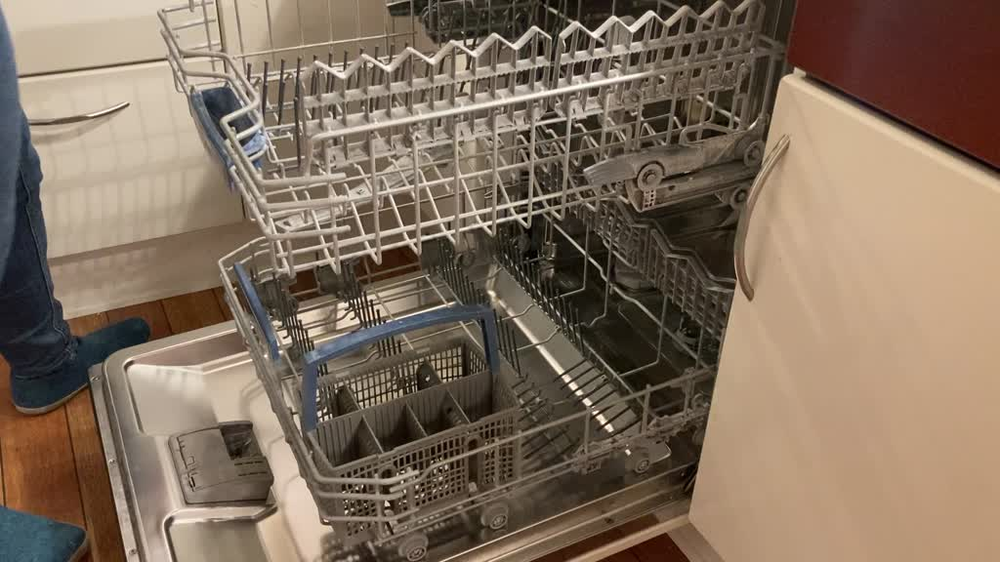

Topic: Dishwasher, Income: 3916.0, Country: Brazil


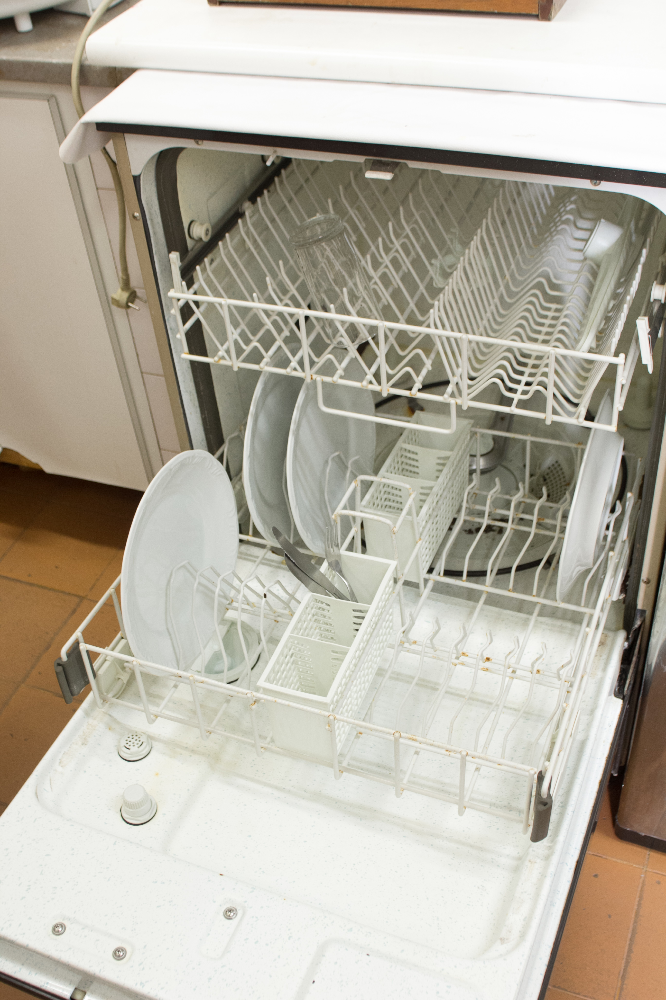

Topic: Doing Dishes,Kitchen sink, Income: 5237.0, Country: Czech Republic


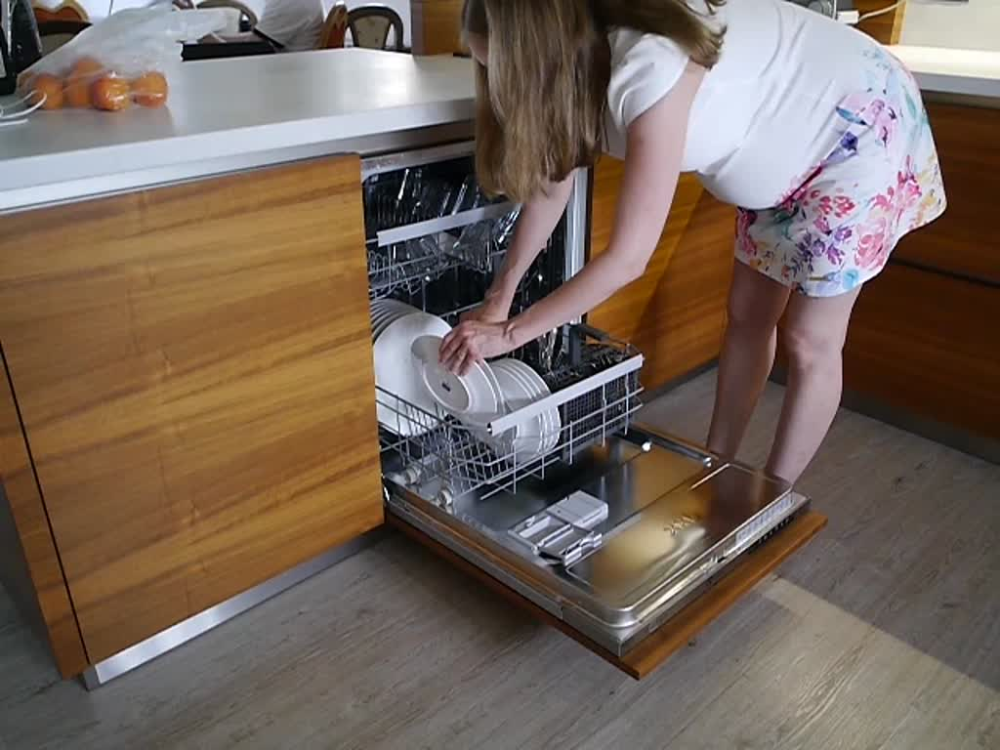

Topic: Dishwasher, Income: 3344.0, Country: Netherlands


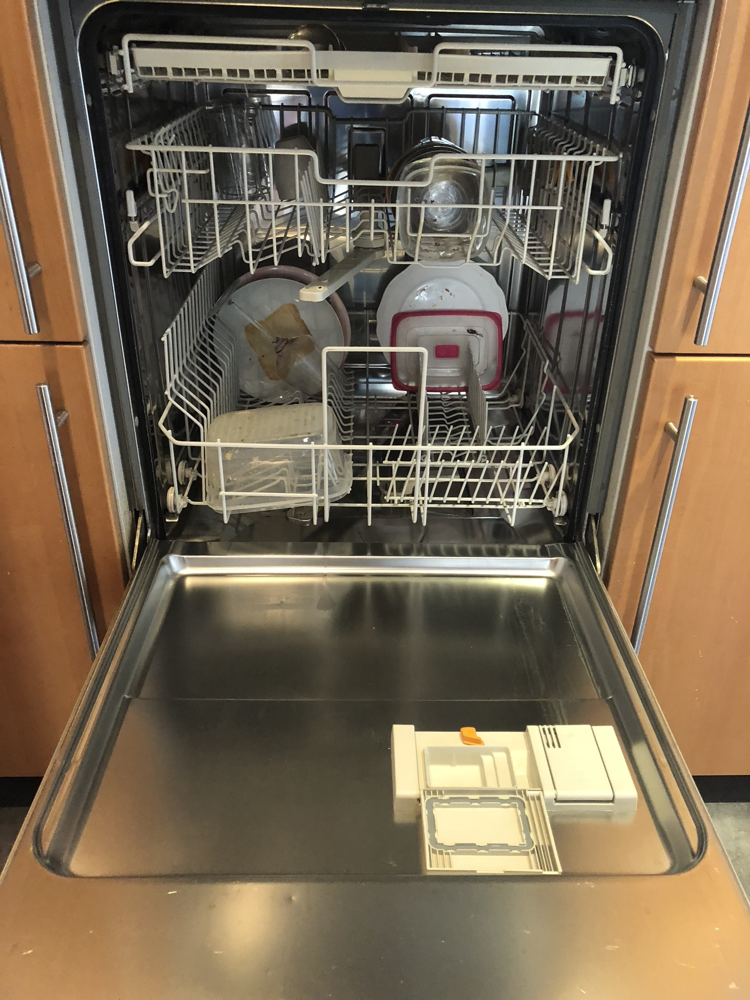

Topic: Dishwasher, Income: 1385.0, Country: Russia


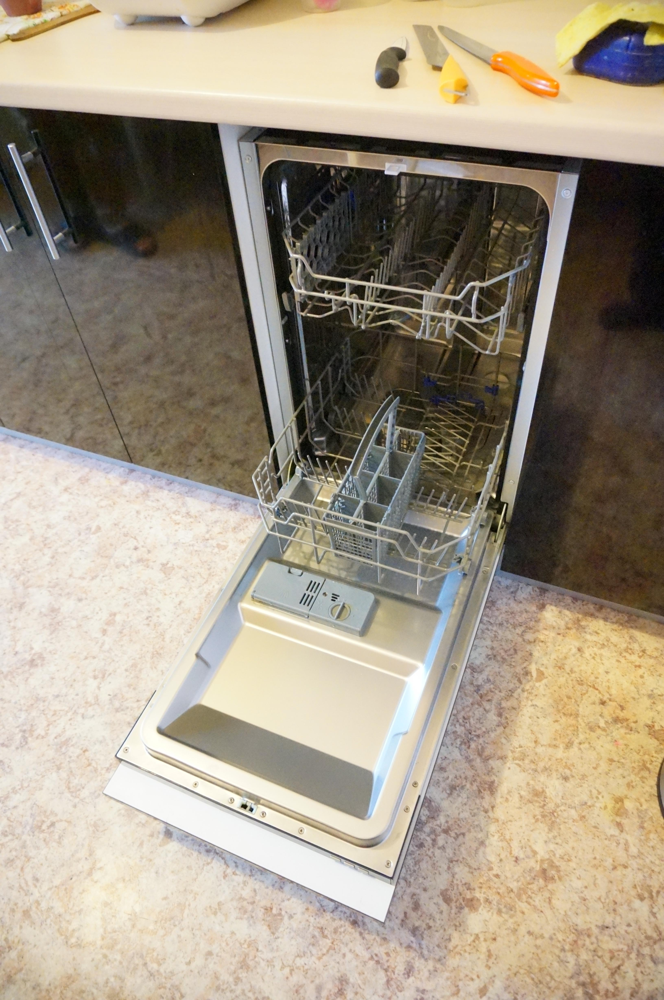

Topic: Dish racks, Income: 1728.0, Country: Netherlands


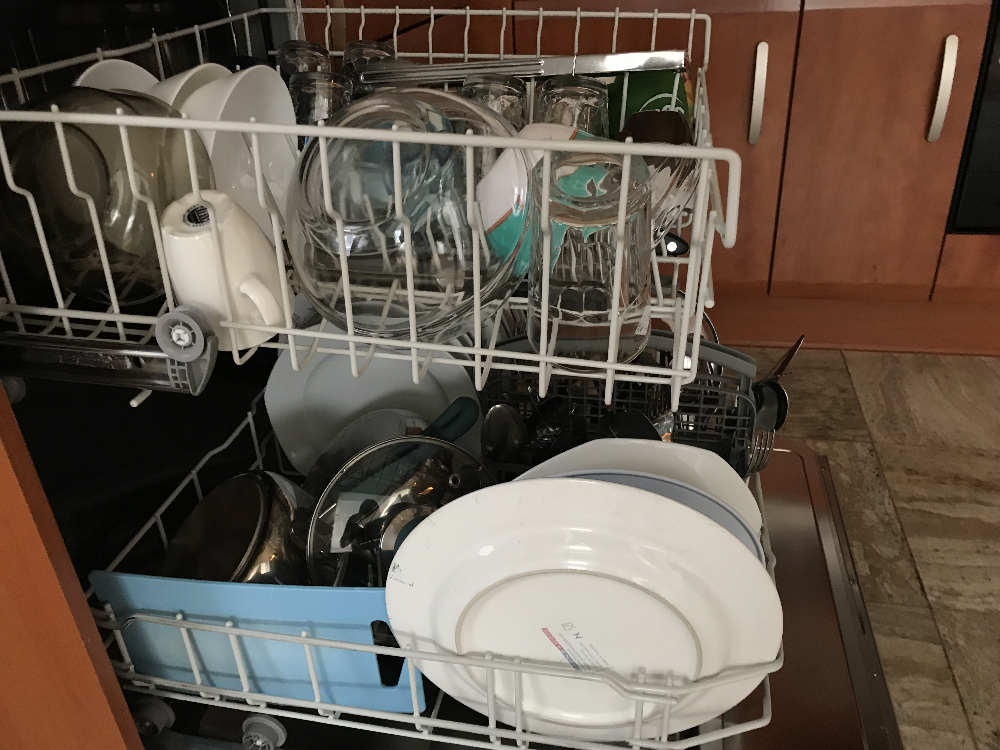

In [131]:
import PIL.Image
import os
from IPython.display import Image, display
for path in p[:6]:
    datapath = path_data + path
    data_point = data[data['imageRelPath'] == path]
    for [income, topic, country] in data_point[['income', 'topics', 'country.name']].values.tolist():
        if os.path.isfile(datapath):
            print(f"Topic: {topic}, Income: {income}, Country: {country}")
            Img = PIL.Image.open(datapath)
            display(Image(filename=datapath, width=400, height=400))
            Img.save(f"Images/topic_dishwasher{topic.split('/')[0]}_{income}_{country}.jpg")

In [ ]:
## We hypothesize that adding functions to prompt will automatically map all objects that can afford that function, howeverwe see that functions return too broad options and miss out the popluar objects that should have been easy 
# therefore it is very important for object names to be included
# adding object names and functions help but the divide is still wide
# we need more conversations around improving visibility of the cultural object names and devising strategies to prompting and training that map functions to all possible objects more precisely.

In [122]:
Pred_pos_images[: 6]

[(0.32177433,
  'assets/5ec4f769f0611d7ddd7405d9/5ec4f769f0611d7ddd7405d9.jpeg',
  'Dish washing brush/cloth'),
 (0.3215266,
  'assets/6057c3b54b011a241927ffbc/b98301ea1f83c80a123886ba2ec388ac/6057c3b54b011a241927ffbc.jpg',
  'Visit,Hair brush/comb'),
 (0.32147303,
  'assets/5ec4f8bff0611d7ddd741180/5ec4f8bff0611d7ddd741180.JPG',
  'Toothbrush'),
 (0.32046342,
  'assets/5d4be371cf0b3a0f3f33e48d/5d4be371cf0b3a0f3f33e48d.jpg',
  'Cooking utensils'),
 (0.3201075,
  'assets/5ec4f5503f62767d97a47318/5ec4f5503f62767d97a47318.jpg',
  'Cooking utensils'),
 (0.3196201,
  'assets/5d4be542cf0b3a0f3f3419a2/5d4be542cf0b3a0f3f3419a2.JPG',
  'Hair brush/comb')]

Topic: Dish washing brush/cloth, Income: 722.0, Country: Colombia


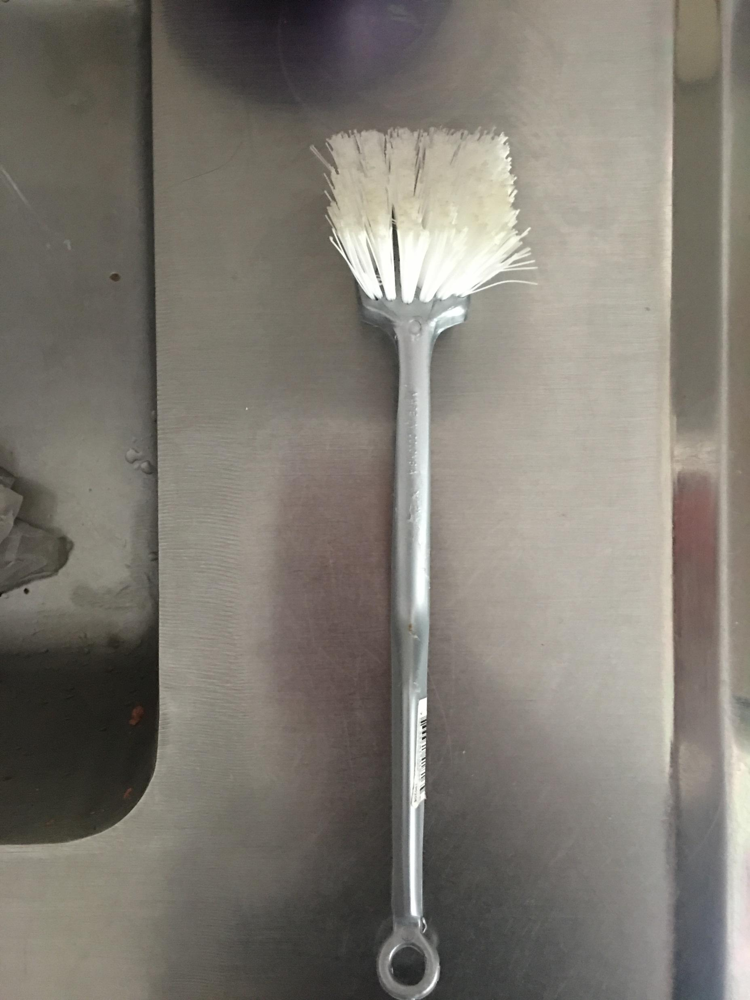

Topic: Visit,Hair brush/comb, Income: 5343.0, Country: Denmark


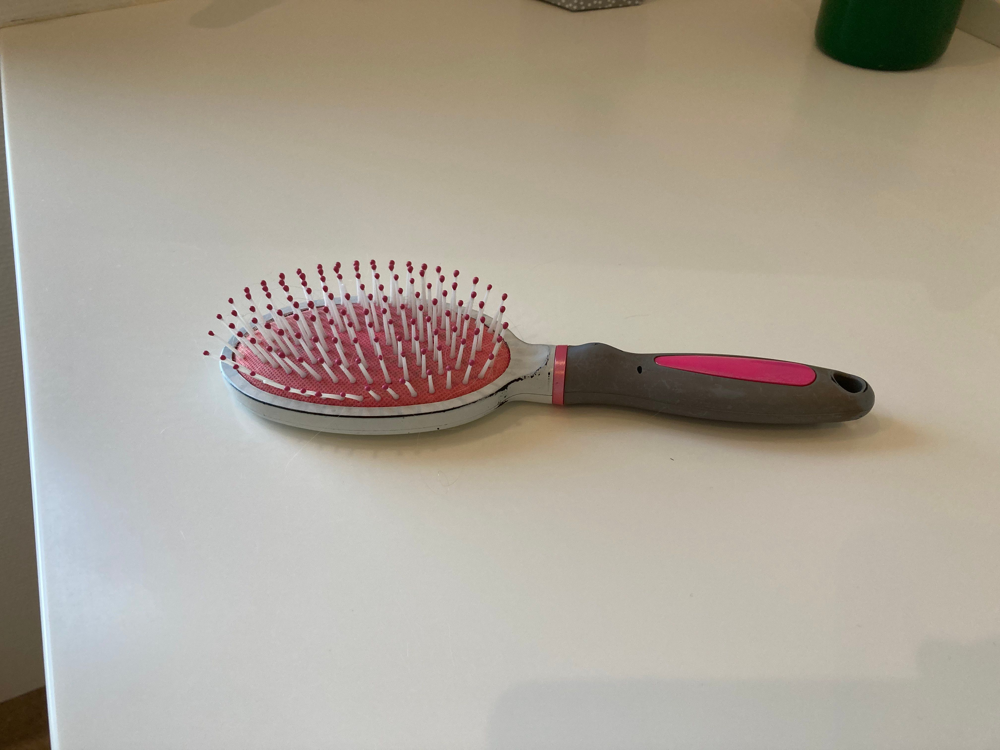

Topic: Toothbrush, Income: 1681.0, Country: Austria


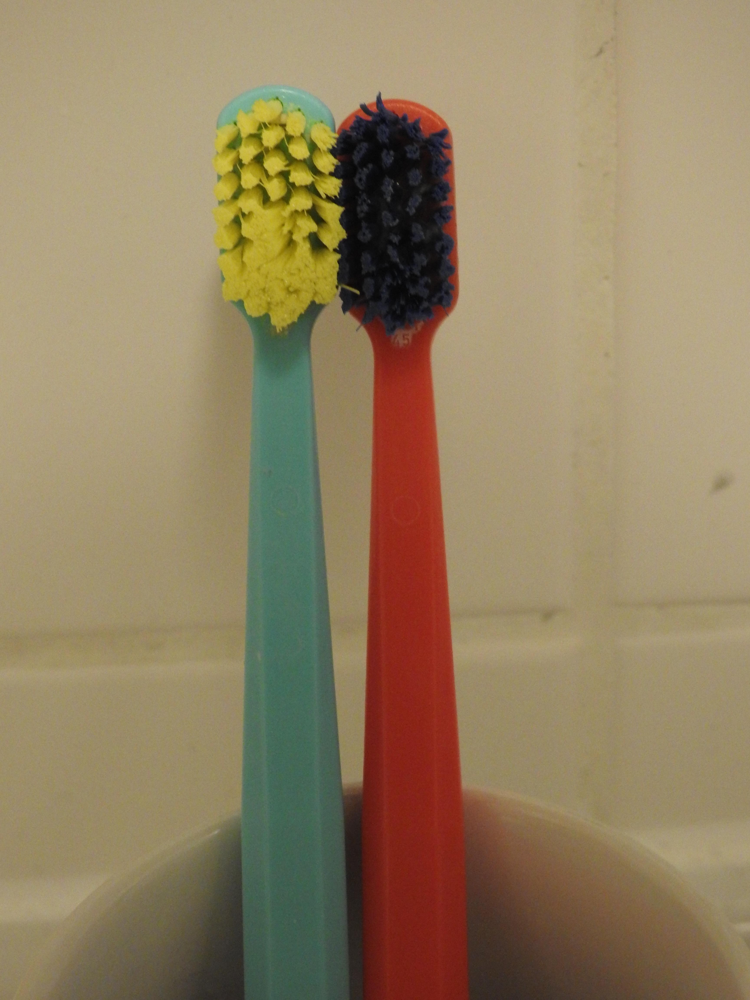

Topic: Cooking utensils, Income: 963.0, Country: India


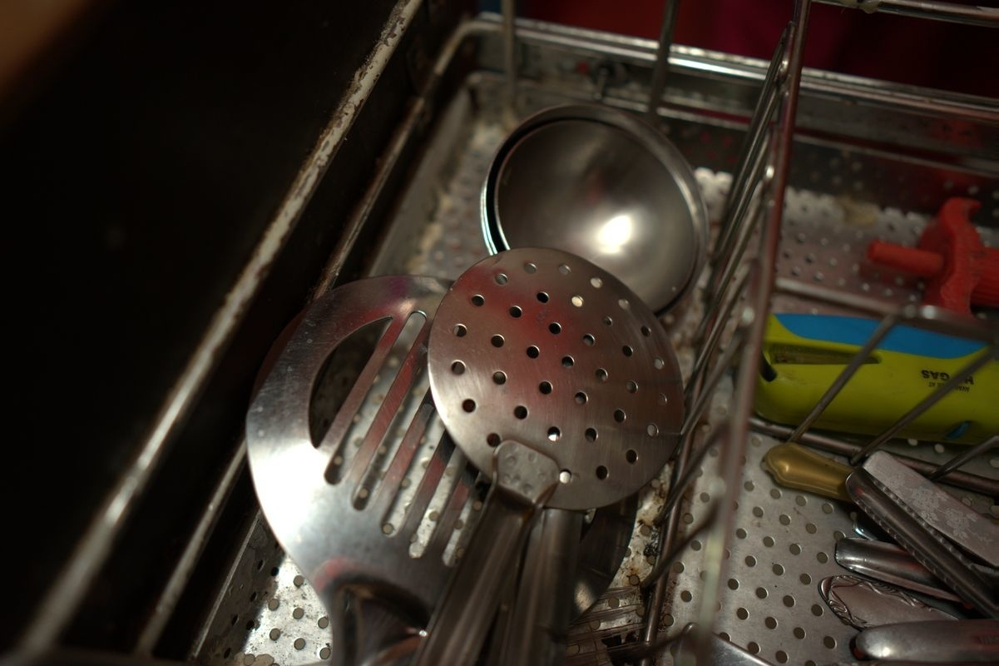

Topic: Cooking utensils, Income: 19671.0, Country: France


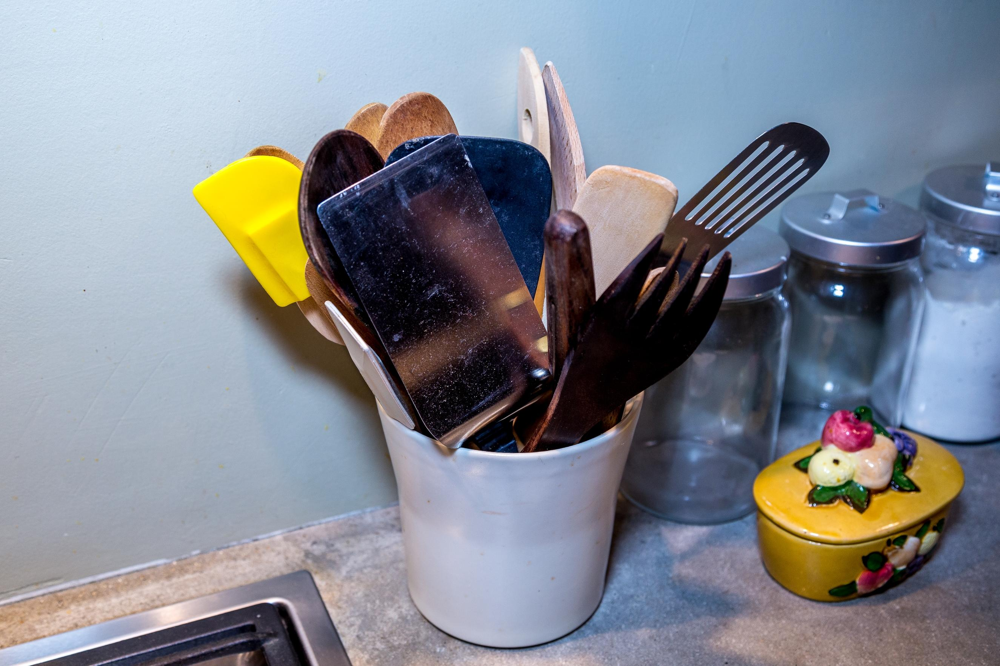

Topic: Hair brush/comb, Income: 855.0, Country: United States


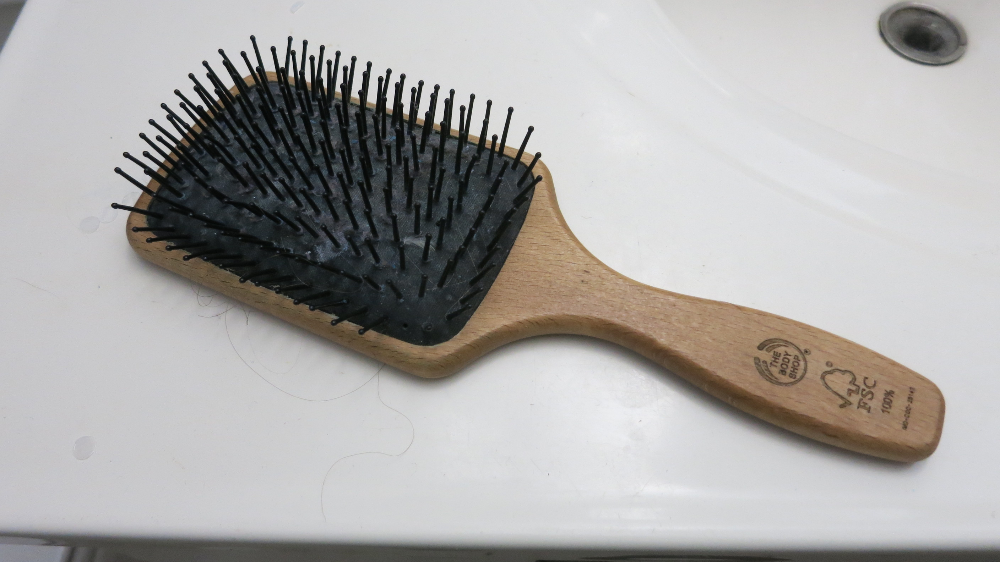

In [123]:
import PIL.Image
import os
from IPython.display import Image, display
for path in p[:6]:
    datapath = path_data + path
    data_point = data[data['imageRelPath'] == path]
    for [income, topic, country] in data_point[['income', 'topics', 'country.name']].values.tolist():
        if os.path.isfile(datapath):
            print(f"Topic: {topic}, Income: {income}, Country: {country}")
            Img = PIL.Image.open(datapath)
            display(Image(filename=datapath, width=400, height=400))
            Img.save(f"Images/function_dishwasher{topic.split('/')[0]}_{income}_{country}.jpg")

## Continue

In [32]:
labels=["poor", "lower-middle", "upper-middle", "rich"]

#list_of_topic2prompt_dict[1]
data["quartile"] = pd.qcut(data["income"], q=[0, 0.25, 0.5, 0.75, 1],    
                         labels=labels)

/tmp/ipykernel_1798929/2101109404.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["quartile"] = pd.qcut(data["income"], q=[0, 0.25, 0.5, 0.75, 1],


In [34]:
#data['function_topic'] = function_topic
#data['functions'] =

In [49]:
# map each image to corresponding topics, countries, income level ... TODO
dict_img2topic, dict_img2country, dict_img2incomelevel, dict_country2region, dict_img2funct_top = {}, {}, {}, {}, {}
#for list_topics, image_path, function_topic, country, incomelevel, region in zip(data['topics'], data['imageRelPath'], data['function_topic'], data['country.name'], data['quartile'], data['region.id']):
for list_topics, image_path, country, incomelevel, region in zip(data['topics'], data['imageRelPath'], data['country.name'], data['quartile'], data['region.id']):
    dict_img2topic[image_path] = list_topics
    dict_img2country[image_path] = country
    dict_img2incomelevel[image_path] = incomelevel
    dict_country2region[country] = region
    #dict_img2funct_top[image_path] = function_topic

print(len(dict_img2topic))
# print(dict_img2country)

36754


In [50]:
for topic in dict_topic2score.keys():
    print(topic)

This is a photo of memories of shared moments.
This is a photo of a set of utensils used for eating and serving food.
This is a photo of a family that provides support and nurturing.
This is a photo of an object that provides a place to eat dinner.
This is a photo of a plate of food that provides nourishment and sustenance.
This is a photo of a space where meals are consumed.
This is a photo of an object that provides a way to access drinking water.
This is a photo of an object that provides heat for cooking food.
This is a photo of a light source in the kitchen that provides illumination for cooking and other activities.
This is a photo of a beverage that hydrates and sustains bodily functions.
This is a photo of an object that provides a place to wash dishes and hands.
This is a photo of a private space for personal hygiene activities.
This is a photo of an outdoor space for recreation and relaxation.
This is a photo of a front door that provides entry and exit to a building.
This is

In [51]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

all_images = list(data['imageRelPath'])
list_dict_topic2FNimg = []
list_dict_topic2F1 = []

#for country_dict in tqdm.tqdm(list_english_score_dicts):
    
dict_topic2FNimg = {}
dict_topic2F1 = {}

for topic in tqdm(dict_topic2score.keys()):
    dict_country_topic2img = dict_function2imgGT
    count_pos = len(dict_country_topic2img[topic])

    GT_pos_images = dict_country_topic2img[topic]
    Pred_pos_images = [data[1] for data in dict_topic2score[topic][:count_pos]]

    GT_labels = [1 if img in GT_pos_images else 0 for img in all_images]
    Pred_labels = [1 if img in Pred_pos_images else 0 for img in all_images]


    accuracy = round(accuracy_score(GT_labels, Pred_labels) * 100, 2)
    precision = round(precision_score(GT_labels, Pred_labels) * 100, 2)
    recall = round(recall_score(GT_labels, Pred_labels) * 100, 2)
    f1 = round(f1_score(GT_labels, Pred_labels) * 100, 2)

    print(f"Acc: {accuracy}, Recall: {recall}, Precision: {precision}, F1: {f1}")

    dict_topic2F1[topic] = f1 
    list_dict_topic2F1.append(dict_topic2F1)


    # What are the forgotten items (FN) 
    images_FN = []
    for idx, img in enumerate(all_images):
        label_GT = GT_labels[idx]
        label_Pred = Pred_labels[idx]
        #FN
        if label_GT == 1 and label_Pred == 0:
            images_FN.append(img) 

    dict_topic2FNimg[topic] = images_FN

list_dict_topic2FNimg.append(dict_topic2FNimg)


  0%|          | 1/270 [00:00<00:53,  5.00it/s]

Acc: 99.58, Recall: 23.53, Precision: 23.53, F1: 23.53


  1%|          | 2/270 [00:00<01:09,  3.84it/s]

Acc: 99.1, Recall: 45.18, Precision: 45.18, F1: 45.18


  1%|          | 3/270 [00:00<01:31,  2.93it/s]

Acc: 98.79, Recall: 56.95, Precision: 56.95, F1: 56.95


  1%|▏         | 4/270 [00:01<01:31,  2.91it/s]

Acc: 98.13, Recall: 9.26, Precision: 9.26, F1: 9.26


  2%|▏         | 5/270 [00:01<01:32,  2.88it/s]

Acc: 98.7, Recall: 39.9, Precision: 39.9, F1: 39.9


  2%|▏         | 6/270 [00:01<01:24,  3.12it/s]

Acc: 98.8, Recall: 6.38, Precision: 6.38, F1: 6.38


  3%|▎         | 7/270 [00:02<01:19,  3.29it/s]

Acc: 98.81, Recall: 5.6, Precision: 5.6, F1: 5.6


  3%|▎         | 8/270 [00:02<01:27,  3.01it/s]

Acc: 98.44, Recall: 35.29, Precision: 35.29, F1: 35.29


  3%|▎         | 9/270 [00:02<01:25,  3.05it/s]

Acc: 98.68, Recall: 21.68, Precision: 21.68, F1: 21.68


  4%|▎         | 10/270 [00:03<01:31,  2.83it/s]

Acc: 97.67, Recall: 11.91, Precision: 11.91, F1: 11.91


  4%|▍         | 11/270 [00:03<01:36,  2.68it/s]

Acc: 98.02, Recall: 24.38, Precision: 24.38, F1: 24.38


  4%|▍         | 12/270 [00:04<01:34,  2.74it/s]

Acc: 98.13, Recall: 7.05, Precision: 7.05, F1: 7.05


  5%|▍         | 13/270 [00:04<01:27,  2.94it/s]

Acc: 98.92, Recall: 19.84, Precision: 19.84, F1: 19.84


  5%|▌         | 14/270 [00:04<01:29,  2.86it/s]

Acc: 98.77, Recall: 43.07, Precision: 43.07, F1: 43.07


  6%|▌         | 15/270 [00:05<01:35,  2.67it/s]

Acc: 97.09, Recall: 1.29, Precision: 1.29, F1: 1.29


  6%|▌         | 16/270 [00:05<01:30,  2.81it/s]

Acc: 98.93, Recall: 34.55, Precision: 34.55, F1: 34.55


  6%|▋         | 17/270 [00:05<01:36,  2.63it/s]

Acc: 97.52, Recall: 13.64, Precision: 13.64, F1: 13.64


  7%|▋         | 18/270 [00:06<01:30,  2.77it/s]

Acc: 98.22, Recall: 0.0, Precision: 0.0, F1: 0.0


  7%|▋         | 19/270 [00:06<01:28,  2.83it/s]

Acc: 98.11, Recall: 3.07, Precision: 3.07, F1: 3.07


  7%|▋         | 20/270 [00:06<01:33,  2.68it/s]

Acc: 99.15, Recall: 68.09, Precision: 68.09, F1: 68.09


  8%|▊         | 21/270 [00:07<01:23,  2.99it/s]

Acc: 99.03, Recall: 3.24, Precision: 3.24, F1: 3.24


  8%|▊         | 22/270 [00:07<01:25,  2.91it/s]

Acc: 98.03, Recall: 9.27, Precision: 9.27, F1: 9.27


  9%|▊         | 23/270 [00:07<01:22,  2.99it/s]

Acc: 98.9, Recall: 36.36, Precision: 36.36, F1: 36.36


  9%|▉         | 24/270 [00:08<01:23,  2.95it/s]

Acc: 98.33, Recall: 14.96, Precision: 14.96, F1: 14.96


 10%|▉         | 26/270 [00:08<01:08,  3.54it/s]

Acc: 98.84, Recall: 32.59, Precision: 32.59, F1: 32.59
Acc: 99.77, Recall: 12.24, Precision: 12.24, F1: 12.24


 10%|█         | 27/270 [00:09<01:11,  3.40it/s]

Acc: 98.86, Recall: 37.43, Precision: 37.43, F1: 37.43


 10%|█         | 28/270 [00:09<01:12,  3.34it/s]

Acc: 98.37, Recall: 4.15, Precision: 4.15, F1: 4.15


 11%|█         | 29/270 [00:09<01:16,  3.13it/s]

Acc: 98.88, Recall: 48.75, Precision: 48.75, F1: 48.75


 11%|█         | 30/270 [00:10<01:24,  2.85it/s]

Acc: 97.96, Recall: 29.03, Precision: 29.03, F1: 29.03


 11%|█▏        | 31/270 [00:10<01:21,  2.94it/s]

Acc: 98.34, Recall: 7.85, Precision: 7.85, F1: 7.85


 12%|█▏        | 32/270 [00:10<01:16,  3.11it/s]

Acc: 98.83, Recall: 14.0, Precision: 14.0, F1: 14.0


 12%|█▏        | 33/270 [00:11<01:19,  2.98it/s]

Acc: 99.03, Recall: 56.66, Precision: 56.66, F1: 56.66


 13%|█▎        | 34/270 [00:11<01:16,  3.08it/s]

Acc: 98.8, Recall: 24.4, Precision: 24.4, F1: 24.4


 13%|█▎        | 35/270 [00:11<01:17,  3.02it/s]

Acc: 98.58, Recall: 28.1, Precision: 28.1, F1: 28.1


 14%|█▎        | 37/270 [00:12<01:06,  3.51it/s]

Acc: 98.54, Recall: 20.94, Precision: 20.94, F1: 20.94
Acc: 99.73, Recall: 28.57, Precision: 28.57, F1: 28.57


 14%|█▍        | 38/270 [00:12<01:07,  3.42it/s]

Acc: 98.47, Recall: 7.26, Precision: 7.26, F1: 7.26


 14%|█▍        | 39/270 [00:12<01:15,  3.07it/s]

Acc: 98.02, Recall: 26.37, Precision: 26.37, F1: 26.37


 15%|█▍        | 40/270 [00:13<01:17,  2.98it/s]

Acc: 98.33, Recall: 26.73, Precision: 26.73, F1: 26.73


 15%|█▌        | 41/270 [00:13<01:19,  2.87it/s]

Acc: 98.06, Recall: 18.72, Precision: 18.72, F1: 18.72


 16%|█▌        | 42/270 [00:13<01:12,  3.16it/s]

Acc: 99.17, Recall: 18.18, Precision: 18.18, F1: 18.18


 16%|█▌        | 43/270 [00:14<01:10,  3.20it/s]

Acc: 98.78, Recall: 25.58, Precision: 25.58, F1: 25.58


 16%|█▋        | 44/270 [00:14<01:12,  3.13it/s]

Acc: 98.37, Recall: 14.53, Precision: 14.53, F1: 14.53


 17%|█▋        | 45/270 [00:14<01:13,  3.05it/s]

Acc: 98.55, Recall: 30.73, Precision: 30.73, F1: 30.73


 17%|█▋        | 46/270 [00:15<01:13,  3.06it/s]

Acc: 98.43, Recall: 15.25, Precision: 15.25, F1: 15.25


 17%|█▋        | 47/270 [00:15<01:12,  3.06it/s]

Acc: 98.54, Recall: 19.28, Precision: 19.28, F1: 19.28


 18%|█▊        | 49/270 [00:16<00:59,  3.73it/s]

Acc: 98.49, Recall: 2.8, Precision: 2.8, F1: 2.8
Acc: 99.95, Recall: 9.09, Precision: 9.09, F1: 9.09


 19%|█▊        | 50/270 [00:16<01:04,  3.42it/s]

Acc: 98.44, Recall: 20.99, Precision: 20.99, F1: 20.99


 19%|█▉        | 51/270 [00:16<01:09,  3.17it/s]

Acc: 98.1, Recall: 17.45, Precision: 17.45, F1: 17.45


 19%|█▉        | 52/270 [00:17<01:05,  3.33it/s]

Acc: 98.87, Recall: 7.56, Precision: 7.56, F1: 7.56


 20%|█▉        | 53/270 [00:17<01:06,  3.25it/s]

Acc: 98.38, Recall: 13.37, Precision: 13.37, F1: 13.37


 20%|██        | 54/270 [00:17<01:09,  3.12it/s]

Acc: 98.49, Recall: 26.53, Precision: 26.53, F1: 26.53


 20%|██        | 55/270 [00:18<01:09,  3.08it/s]

Acc: 98.47, Recall: 21.29, Precision: 21.29, F1: 21.29


 21%|██        | 56/270 [00:18<01:14,  2.89it/s]

Acc: 98.04, Recall: 22.41, Precision: 22.41, F1: 22.41


 21%|██▏       | 58/270 [00:19<01:05,  3.22it/s]

Acc: 97.59, Recall: 19.93, Precision: 19.93, F1: 19.93
Acc: 99.95, Recall: 62.5, Precision: 62.5, F1: 62.5


 22%|██▏       | 60/270 [00:19<00:55,  3.79it/s]

Acc: 98.92, Recall: 17.08, Precision: 17.08, F1: 17.08
Acc: 99.63, Recall: 2.86, Precision: 2.86, F1: 2.86


 23%|██▎       | 62/270 [00:21<02:06,  1.65it/s]

Acc: 83.88, Recall: 6.03, Precision: 6.03, F1: 6.03
Acc: 99.74, Recall: 2.04, Precision: 2.04, F1: 2.04


 24%|██▎       | 64/270 [00:22<01:23,  2.47it/s]

Acc: 99.24, Recall: 22.35, Precision: 22.35, F1: 22.35
Acc: 99.47, Recall: 0.0, Precision: 0.0, F1: 0.0


 24%|██▍       | 65/270 [00:22<01:12,  2.82it/s]

Acc: 99.1, Recall: 7.78, Precision: 7.78, F1: 7.78


 24%|██▍       | 66/270 [00:22<01:04,  3.17it/s]

Acc: 99.25, Recall: 8.0, Precision: 8.0, F1: 8.0


 25%|██▍       | 67/270 [00:22<00:58,  3.47it/s]

Acc: 99.18, Recall: 15.17, Precision: 15.17, F1: 15.17


 25%|██▌       | 68/270 [00:23<00:55,  3.63it/s]

Acc: 99.13, Recall: 18.78, Precision: 18.78, F1: 18.78


 26%|██▌       | 69/270 [00:23<00:54,  3.69it/s]

Acc: 98.93, Recall: 5.29, Precision: 5.29, F1: 5.29


 26%|██▌       | 70/270 [00:23<00:51,  3.85it/s]

Acc: 99.08, Recall: 0.0, Precision: 0.0, F1: 0.0


 26%|██▋       | 71/270 [00:23<00:51,  3.86it/s]

Acc: 98.94, Recall: 7.14, Precision: 7.14, F1: 7.14


 27%|██▋       | 73/270 [00:24<00:45,  4.35it/s]

Acc: 99.21, Recall: 20.65, Precision: 20.65, F1: 20.65
Acc: 99.65, Recall: 17.95, Precision: 17.95, F1: 17.95


 27%|██▋       | 74/270 [00:24<00:56,  3.47it/s]

Acc: 97.65, Recall: 14.62, Precision: 14.62, F1: 14.62


 28%|██▊       | 76/270 [00:25<00:47,  4.13it/s]

Acc: 99.33, Recall: 0.81, Precision: 0.81, F1: 0.81
Acc: 99.62, Recall: 35.51, Precision: 35.51, F1: 35.51


 29%|██▊       | 77/270 [00:25<00:50,  3.84it/s]

Acc: 99.24, Recall: 52.22, Precision: 52.22, F1: 52.22


 29%|██▉       | 78/270 [00:25<00:50,  3.80it/s]

Acc: 98.77, Recall: 3.0, Precision: 3.0, F1: 3.0


 29%|██▉       | 79/270 [00:25<00:49,  3.83it/s]

Acc: 99.29, Recall: 38.1, Precision: 38.1, F1: 38.1


 30%|██▉       | 80/270 [00:26<00:53,  3.57it/s]

Acc: 98.27, Recall: 6.47, Precision: 6.47, F1: 6.47


 30%|███       | 81/270 [00:26<00:56,  3.32it/s]

Acc: 99.07, Recall: 54.42, Precision: 54.42, F1: 54.42


 30%|███       | 82/270 [00:26<00:52,  3.57it/s]

Acc: 99.12, Recall: 1.23, Precision: 1.23, F1: 1.23


 31%|███       | 83/270 [00:27<00:54,  3.40it/s]

Acc: 98.36, Recall: 11.73, Precision: 11.73, F1: 11.73


 31%|███▏      | 85/270 [00:27<00:48,  3.79it/s]

Acc: 98.87, Recall: 25.81, Precision: 25.81, F1: 25.81
Acc: 99.46, Recall: 0.0, Precision: 0.0, F1: 0.0


 32%|███▏      | 86/270 [00:27<00:52,  3.51it/s]

Acc: 98.54, Recall: 21.57, Precision: 21.57, F1: 21.57


 32%|███▏      | 87/270 [00:28<00:54,  3.34it/s]

Acc: 98.13, Recall: 2.0, Precision: 2.0, F1: 2.0


 33%|███▎      | 88/270 [00:28<00:52,  3.47it/s]

Acc: 98.9, Recall: 7.34, Precision: 7.34, F1: 7.34


 33%|███▎      | 89/270 [00:28<00:55,  3.26it/s]

Acc: 99.23, Recall: 62.2, Precision: 62.2, F1: 62.2


 33%|███▎      | 90/270 [00:29<00:55,  3.27it/s]

Acc: 98.65, Recall: 17.61, Precision: 17.61, F1: 17.61


 34%|███▎      | 91/270 [00:29<00:54,  3.27it/s]

Acc: 98.53, Recall: 10.3, Precision: 10.3, F1: 10.3


 34%|███▍      | 92/270 [00:29<00:50,  3.49it/s]

Acc: 99.22, Recall: 20.11, Precision: 20.11, F1: 20.11


 34%|███▍      | 93/270 [00:30<00:52,  3.36it/s]

Acc: 98.65, Recall: 26.19, Precision: 26.19, F1: 26.19


 35%|███▍      | 94/270 [00:30<00:54,  3.24it/s]

Acc: 98.14, Recall: 4.48, Precision: 4.48, F1: 4.48


 36%|███▌      | 96/270 [00:30<00:44,  3.95it/s]

Acc: 99.32, Recall: 14.97, Precision: 14.97, F1: 14.97
Acc: 99.59, Recall: 0.0, Precision: 0.0, F1: 0.0


 36%|███▌      | 97/270 [00:30<00:39,  4.37it/s]

Acc: 99.8, Recall: 30.19, Precision: 30.19, F1: 30.19


 36%|███▋      | 98/270 [00:31<00:43,  3.98it/s]

Acc: 98.68, Recall: 17.97, Precision: 17.97, F1: 17.97


 37%|███▋      | 99/270 [00:31<00:44,  3.88it/s]

Acc: 98.93, Recall: 20.24, Precision: 20.24, F1: 20.24


 37%|███▋      | 100/270 [00:31<00:47,  3.60it/s]

Acc: 98.2, Recall: 0.0, Precision: 0.0, F1: 0.0


 37%|███▋      | 101/270 [00:32<00:48,  3.48it/s]

Acc: 98.39, Recall: 3.59, Precision: 3.59, F1: 3.59


 38%|███▊      | 102/270 [00:32<00:49,  3.40it/s]

Acc: 98.6, Recall: 15.69, Precision: 15.69, F1: 15.69


 39%|███▊      | 104/270 [00:32<00:43,  3.81it/s]

Acc: 98.28, Recall: 3.65, Precision: 3.65, F1: 3.65
Acc: 99.79, Recall: 0.0, Precision: 0.0, F1: 0.0


 39%|███▉      | 105/270 [00:33<00:41,  4.00it/s]

Acc: 99.16, Recall: 7.23, Precision: 7.23, F1: 7.23


 40%|███▉      | 107/270 [00:33<00:35,  4.55it/s]

Acc: 99.25, Recall: 1.44, Precision: 1.44, F1: 1.44
Acc: 99.75, Recall: 23.33, Precision: 23.33, F1: 23.33


 40%|████      | 109/270 [00:33<00:32,  4.89it/s]

Acc: 99.47, Recall: 11.71, Precision: 11.71, F1: 11.71
Acc: 99.84, Recall: 57.14, Precision: 57.14, F1: 57.14


 41%|████      | 110/270 [00:34<00:33,  4.77it/s]

Acc: 99.2, Recall: 0.0, Precision: 0.0, F1: 0.0


 41%|████      | 111/270 [00:34<00:35,  4.54it/s]

Acc: 99.24, Recall: 23.91, Precision: 23.91, F1: 23.91


 41%|████▏     | 112/270 [00:34<00:40,  3.86it/s]

Acc: 98.37, Recall: 19.35, Precision: 19.35, F1: 19.35


 42%|████▏     | 113/270 [00:35<00:39,  3.97it/s]

Acc: 99.08, Recall: 0.0, Precision: 0.0, F1: 0.0


 42%|████▏     | 114/270 [00:35<00:39,  4.00it/s]

Acc: 99.12, Recall: 17.01, Precision: 17.01, F1: 17.01


 43%|████▎     | 115/270 [00:35<00:42,  3.68it/s]

Acc: 98.78, Recall: 29.69, Precision: 29.69, F1: 29.69


 43%|████▎     | 116/270 [00:35<00:43,  3.52it/s]

Acc: 98.59, Recall: 17.46, Precision: 17.46, F1: 17.46


 43%|████▎     | 117/270 [00:36<00:44,  3.46it/s]

Acc: 98.52, Recall: 6.85, Precision: 6.85, F1: 6.85


 44%|████▎     | 118/270 [00:36<00:45,  3.31it/s]

Acc: 98.82, Recall: 35.91, Precision: 35.91, F1: 35.91


 44%|████▍     | 119/270 [00:36<00:45,  3.34it/s]

Acc: 98.71, Recall: 11.9, Precision: 11.9, F1: 11.9


 44%|████▍     | 120/270 [00:37<00:41,  3.62it/s]

Acc: 99.36, Recall: 15.22, Precision: 15.22, F1: 15.22


 45%|████▍     | 121/270 [00:37<00:39,  3.76it/s]

Acc: 99.73, Recall: 73.37, Precision: 73.37, F1: 73.37


 46%|████▌     | 123/270 [00:37<00:34,  4.29it/s]

Acc: 99.25, Recall: 14.91, Precision: 14.91, F1: 14.91
Acc: 99.62, Recall: 9.09, Precision: 9.09, F1: 9.09


 46%|████▌     | 124/270 [00:38<00:37,  3.86it/s]

Acc: 98.96, Recall: 38.78, Precision: 38.78, F1: 38.78


 46%|████▋     | 125/270 [00:38<00:39,  3.68it/s]

Acc: 99.3, Recall: 55.21, Precision: 55.21, F1: 55.21


 47%|████▋     | 126/270 [00:38<00:38,  3.73it/s]

Acc: 99.14, Recall: 25.47, Precision: 25.47, F1: 25.47


 47%|████▋     | 128/270 [00:38<00:32,  4.41it/s]

Acc: 99.18, Recall: 21.35, Precision: 21.35, F1: 21.35
Acc: 99.98, Recall: 0.0, Precision: 0.0, F1: 0.0


 48%|████▊     | 130/270 [00:39<00:32,  4.30it/s]

Acc: 98.51, Recall: 29.09, Precision: 29.09, F1: 29.09
Acc: 99.9, Recall: 18.18, Precision: 18.18, F1: 18.18


 49%|████▊     | 131/270 [00:39<00:36,  3.81it/s]

Acc: 98.53, Recall: 18.37, Precision: 18.37, F1: 18.37


 49%|████▉     | 132/270 [00:40<00:37,  3.72it/s]

Acc: 98.88, Recall: 18.58, Precision: 18.58, F1: 18.58


 49%|████▉     | 133/270 [00:40<00:34,  3.93it/s]

Acc: 99.28, Recall: 9.52, Precision: 9.52, F1: 9.52
Acc: 99.49, Recall: 16.22, Precision: 16.22, F1: 16.22


 50%|█████     | 135/270 [00:40<00:30,  4.36it/s]

Acc: 99.55, Recall: 25.23, Precision: 25.23, F1: 25.23


 50%|█████     | 136/270 [00:40<00:30,  4.43it/s]

Acc: 99.64, Recall: 51.82, Precision: 51.82, F1: 51.82


 51%|█████     | 137/270 [00:41<00:29,  4.49it/s]

Acc: 99.41, Recall: 19.85, Precision: 19.85, F1: 19.85


 51%|█████     | 138/270 [00:41<00:28,  4.58it/s]

Acc: 99.49, Recall: 23.58, Precision: 23.58, F1: 23.58


 51%|█████▏    | 139/270 [00:41<00:28,  4.59it/s]

Acc: 99.34, Recall: 9.7, Precision: 9.7, F1: 9.7


 52%|█████▏    | 141/270 [00:41<00:26,  4.85it/s]

Acc: 99.2, Recall: 0.68, Precision: 0.68, F1: 0.68
Acc: 99.68, Recall: 3.33, Precision: 3.33, F1: 3.33


 53%|█████▎    | 143/270 [00:42<00:24,  5.11it/s]

Acc: 99.65, Recall: 11.11, Precision: 11.11, F1: 11.11
Acc: 99.56, Recall: 6.9, Precision: 6.9, F1: 6.9


 53%|█████▎    | 144/270 [00:42<00:24,  5.16it/s]

Acc: 99.6, Recall: 22.92, Precision: 22.92, F1: 22.92
Acc: 99.47, Recall: 6.67, Precision: 6.67, F1: 6.67


 54%|█████▍    | 147/270 [00:43<00:23,  5.24it/s]

Acc: 99.02, Recall: 6.22, Precision: 6.22, F1: 6.22
Acc: 99.98, Recall: 0.0, Precision: 0.0, F1: 0.0


 55%|█████▌    | 149/270 [00:43<00:24,  5.02it/s]

Acc: 99.13, Recall: 23.08, Precision: 23.08, F1: 23.08
Acc: 99.74, Recall: 0.0, Precision: 0.0, F1: 0.0


 56%|█████▌    | 151/270 [00:43<00:21,  5.51it/s]

Acc: 99.99, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.7, Recall: 13.85, Precision: 13.85, F1: 13.85


 57%|█████▋    | 153/270 [00:44<00:21,  5.47it/s]

Acc: 99.39, Recall: 10.4, Precision: 10.4, F1: 10.4
Acc: 99.75, Recall: 4.17, Precision: 4.17, F1: 4.17


 57%|█████▋    | 154/270 [00:44<00:19,  5.82it/s]

Acc: 99.98, Recall: 0.0, Precision: 0.0, F1: 0.0


 57%|█████▋    | 155/270 [00:44<00:21,  5.43it/s]

Acc: 99.33, Recall: 5.34, Precision: 5.34, F1: 5.34


 58%|█████▊    | 156/270 [00:44<00:26,  4.23it/s]

Acc: 98.43, Recall: 25.71, Precision: 25.71, F1: 25.71


 59%|█████▊    | 158/270 [00:45<00:24,  4.62it/s]

Acc: 99.85, Recall: 81.63, Precision: 81.63, F1: 81.63
Acc: 99.66, Recall: 7.46, Precision: 7.46, F1: 7.46


 59%|█████▉    | 160/270 [00:45<00:20,  5.25it/s]

Acc: 99.8, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.78, Recall: 24.07, Precision: 24.07, F1: 24.07


 60%|██████    | 162/270 [00:46<00:20,  5.37it/s]

Acc: 99.61, Recall: 6.58, Precision: 6.58, F1: 6.58
Acc: 99.58, Recall: 3.7, Precision: 3.7, F1: 3.7


 61%|██████    | 164/270 [00:46<00:24,  4.32it/s]

Acc: 98.08, Recall: 28.74, Precision: 28.74, F1: 28.74
Acc: 99.73, Recall: 15.52, Precision: 15.52, F1: 15.52


 61%|██████▏   | 166/270 [00:47<00:20,  4.99it/s]

Acc: 99.87, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.62, Recall: 1.41, Precision: 1.41, F1: 1.41


 62%|██████▏   | 168/270 [00:47<00:17,  5.68it/s]

Acc: 99.99, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.88, Recall: 15.38, Precision: 15.38, F1: 15.38


 63%|██████▎   | 170/270 [00:47<00:17,  5.77it/s]

Acc: 99.93, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.58, Recall: 3.7, Precision: 3.7, F1: 3.7


 64%|██████▎   | 172/270 [00:48<00:17,  5.54it/s]

Acc: 99.54, Recall: 33.33, Precision: 33.33, F1: 33.33
Acc: 99.73, Recall: 3.85, Precision: 3.85, F1: 3.85


 64%|██████▍   | 173/270 [00:48<00:17,  5.66it/s]

Acc: 99.76, Recall: 0.0, Precision: 0.0, F1: 0.0


 65%|██████▍   | 175/270 [00:48<00:17,  5.34it/s]

Acc: 99.4, Recall: 12.6, Precision: 12.6, F1: 12.6
Acc: 99.72, Recall: 38.55, Precision: 38.55, F1: 38.55


 66%|██████▌   | 177/270 [00:48<00:15,  5.98it/s]

Acc: 99.95, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.98, Recall: 20.0, Precision: 20.0, F1: 20.0


 66%|██████▋   | 179/270 [00:49<00:15,  5.86it/s]

Acc: 99.72, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.64, Recall: 4.29, Precision: 4.29, F1: 4.29


 67%|██████▋   | 181/270 [00:49<00:15,  5.78it/s]

Acc: 99.9, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.53, Recall: 2.27, Precision: 2.27, F1: 2.27


 68%|██████▊   | 183/270 [00:49<00:15,  5.76it/s]

Acc: 99.56, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.77, Recall: 0.0, Precision: 0.0, F1: 0.0


 69%|██████▊   | 185/270 [00:50<00:14,  5.84it/s]

Acc: 99.77, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.7, Recall: 3.51, Precision: 3.51, F1: 3.51


 69%|██████▉   | 187/270 [00:50<00:13,  6.11it/s]

Acc: 99.93, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.83, Recall: 0.0, Precision: 0.0, F1: 0.0


 70%|███████   | 189/270 [00:50<00:13,  6.01it/s]

Acc: 99.58, Recall: 6.02, Precision: 6.02, F1: 6.02
Acc: 99.85, Recall: 0.0, Precision: 0.0, F1: 0.0


 71%|███████   | 191/270 [00:51<00:12,  6.14it/s]

Acc: 99.63, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.99, Recall: 0.0, Precision: 0.0, F1: 0.0


 71%|███████▏  | 193/270 [00:51<00:12,  6.06it/s]

Acc: 99.46, Recall: 1.98, Precision: 1.98, F1: 1.98
Acc: 99.99, Recall: 33.33, Precision: 33.33, F1: 33.33


 72%|███████▏  | 195/270 [00:51<00:11,  6.43it/s]

Acc: 99.99, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.97, Recall: 14.29, Precision: 14.29, F1: 14.29


 73%|███████▎  | 197/270 [00:52<00:11,  6.62it/s]

Acc: 99.98, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.97, Recall: 0.0, Precision: 0.0, F1: 0.0


 74%|███████▎  | 199/270 [00:52<00:11,  6.33it/s]

Acc: 99.48, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.99, Recall: 0.0, Precision: 0.0, F1: 0.0


 74%|███████▍  | 201/270 [00:52<00:10,  6.45it/s]

Acc: 99.89, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.93, Recall: 0.0, Precision: 0.0, F1: 0.0


 75%|███████▌  | 203/270 [00:53<00:10,  6.50it/s]

Acc: 99.88, Recall: 26.67, Precision: 26.67, F1: 26.67
Acc: 99.95, Recall: 0.0, Precision: 0.0, F1: 0.0


 76%|███████▌  | 205/270 [00:53<00:09,  6.69it/s]

Acc: 99.98, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.99, Recall: 0.0, Precision: 0.0, F1: 0.0


 76%|███████▋  | 206/270 [00:53<00:09,  6.75it/s]

Acc: 99.99, Recall: 0.0, Precision: 0.0, F1: 0.0


 77%|███████▋  | 208/270 [00:53<00:10,  5.94it/s]

Acc: 99.14, Recall: 15.51, Precision: 15.51, F1: 15.51
Acc: 99.97, Recall: 0.0, Precision: 0.0, F1: 0.0


 78%|███████▊  | 210/270 [00:54<00:10,  5.79it/s]

Acc: 99.84, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.54, Recall: 0.0, Precision: 0.0, F1: 0.0


 79%|███████▊  | 212/270 [00:54<00:10,  5.67it/s]

Acc: 99.66, Recall: 36.73, Precision: 36.73, F1: 36.73
Acc: 99.71, Recall: 3.64, Precision: 3.64, F1: 3.64


 79%|███████▉  | 214/270 [00:55<00:09,  5.70it/s]

Acc: 99.24, Recall: 4.14, Precision: 4.14, F1: 4.14
Acc: 99.98, Recall: 0.0, Precision: 0.0, F1: 0.0


 80%|████████  | 216/270 [00:55<00:08,  6.04it/s]

Acc: 99.76, Recall: 13.73, Precision: 13.73, F1: 13.73
Acc: 99.98, Recall: 0.0, Precision: 0.0, F1: 0.0


 81%|████████  | 218/270 [00:55<00:08,  6.13it/s]

Acc: 99.74, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.89, Recall: 0.0, Precision: 0.0, F1: 0.0


 81%|████████▏ | 220/270 [00:55<00:07,  6.45it/s]

Acc: 99.96, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.97, Recall: 0.0, Precision: 0.0, F1: 0.0


 82%|████████▏ | 222/270 [00:56<00:08,  5.77it/s]

Acc: 99.02, Recall: 0.55, Precision: 0.55, F1: 0.55
Acc: 99.87, Recall: 4.0, Precision: 4.0, F1: 4.0


 83%|████████▎ | 224/270 [00:56<00:07,  5.87it/s]

Acc: 99.49, Recall: 1.06, Precision: 1.06, F1: 1.06
Acc: 99.96, Recall: 12.5, Precision: 12.5, F1: 12.5


 84%|████████▎ | 226/270 [00:57<00:07,  6.03it/s]

Acc: 99.78, Recall: 6.98, Precision: 6.98, F1: 6.98
Acc: 99.86, Recall: 23.53, Precision: 23.53, F1: 23.53


 84%|████████▍ | 228/270 [00:57<00:07,  5.99it/s]

Acc: 99.99, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.65, Recall: 14.47, Precision: 14.47, F1: 14.47


 85%|████████▌ | 230/270 [00:57<00:06,  6.10it/s]

Acc: 99.94, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.74, Recall: 4.08, Precision: 4.08, F1: 4.08


 86%|████████▌ | 232/270 [00:58<00:06,  5.99it/s]

Acc: 99.81, Recall: 10.26, Precision: 10.26, F1: 10.26
Acc: 99.9, Recall: 68.97, Precision: 68.97, F1: 68.97


 87%|████████▋ | 234/270 [00:58<00:05,  6.13it/s]

Acc: 99.99, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.73, Recall: 2.0, Precision: 2.0, F1: 2.0


 87%|████████▋ | 236/270 [00:58<00:05,  5.97it/s]

Acc: 99.97, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.55, Recall: 1.2, Precision: 1.2, F1: 1.2


 88%|████████▊ | 238/270 [00:58<00:05,  6.37it/s]

Acc: 99.98, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.96, Recall: 0.0, Precision: 0.0, F1: 0.0


 89%|████████▉ | 240/270 [00:59<00:04,  6.60it/s]

Acc: 99.98, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.97, Recall: 0.0, Precision: 0.0, F1: 0.0


 90%|████████▉ | 242/270 [00:59<00:04,  6.72it/s]

Acc: 99.99, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.97, Recall: 0.0, Precision: 0.0, F1: 0.0


 90%|█████████ | 244/270 [00:59<00:03,  6.77it/s]

Acc: 99.99, Recall: 50.0, Precision: 50.0, F1: 50.0
Acc: 99.97, Recall: 0.0, Precision: 0.0, F1: 0.0


 91%|█████████ | 246/270 [01:00<00:03,  6.76it/s]

Acc: 99.96, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.95, Recall: 0.0, Precision: 0.0, F1: 0.0


 92%|█████████▏| 248/270 [01:00<00:03,  6.76it/s]

Acc: 99.96, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.97, Recall: 28.57, Precision: 28.57, F1: 28.57


 93%|█████████▎| 250/270 [01:00<00:02,  6.81it/s]

Acc: 99.98, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.99, Recall: 0.0, Precision: 0.0, F1: 0.0


 93%|█████████▎| 252/270 [01:01<00:02,  6.86it/s]

Acc: 99.99, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.99, Recall: 0.0, Precision: 0.0, F1: 0.0


 94%|█████████▍| 254/270 [01:01<00:02,  6.84it/s]

Acc: 99.98, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.98, Recall: 0.0, Precision: 0.0, F1: 0.0


 95%|█████████▍| 256/270 [01:01<00:02,  6.84it/s]

Acc: 99.97, Recall: 16.67, Precision: 16.67, F1: 16.67
Acc: 99.99, Recall: 0.0, Precision: 0.0, F1: 0.0


 96%|█████████▌| 258/270 [01:01<00:01,  6.83it/s]

Acc: 99.98, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.98, Recall: 0.0, Precision: 0.0, F1: 0.0


 96%|█████████▋| 260/270 [01:02<00:01,  6.86it/s]

Acc: 99.99, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.99, Recall: 0.0, Precision: 0.0, F1: 0.0


 97%|█████████▋| 262/270 [01:02<00:01,  6.79it/s]

Acc: 99.98, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.99, Recall: 0.0, Precision: 0.0, F1: 0.0


 98%|█████████▊| 264/270 [01:02<00:00,  6.83it/s]

Acc: 99.99, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.99, Recall: 0.0, Precision: 0.0, F1: 0.0


 99%|█████████▊| 266/270 [01:03<00:00,  6.86it/s]

Acc: 99.99, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 100.0, Recall: 100.0, Precision: 100.0, F1: 100.0


 99%|█████████▉| 268/270 [01:03<00:00,  6.88it/s]

Acc: 99.99, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.99, Recall: 0.0, Precision: 0.0, F1: 0.0


100%|██████████| 270/270 [01:03<00:00,  4.24it/s]

Acc: 99.99, Recall: 0.0, Precision: 0.0, F1: 0.0
Acc: 99.99, Recall: 0.0, Precision: 0.0, F1: 0.0


In [36]:
f = open("sep_funtion_dict_topic2FNimg.pkl","wb")

# write the python object (dict) to pickle file
pickle.dump(dict_topic2FNimg,f)

# close file
f.close()

In [37]:
f = open("sep_funtion_dict_topic2F1.pkl","wb")

# write the python object (dict) to pickle file
pickle.dump(dict_topic2F1,f)

# close file
f.close()

In [27]:
topic2function['brushing hair']

'This is a photo of brushing hair untangles and smooths the hair.'

In [52]:
lang_list_dict_topic2FNimg = list_dict_topic2FNimg[0]

In [53]:
from collections import Counter

all_topic_all_income_percountrydf = pd.DataFrame()
all_topic_all_country_perincomedf = pd.DataFrame()
language_recall_df = pd.DataFrame()


    
#### forgotten images block (countrywise)

list_all_countriesFN = []
list_all_incomeFN = []
dict_topic2FNCountry = {}
dict_all_Countries_FN = {}
lang_dict = lang_list_dict_topic2FNimg

for topic in lang_dict:

    #dict_lang2translation = next(item for item in list_dict_lang2translation if topic.split(';')[1].strip() in list(item.values())[0])
    dominant_lang = 'English'
    list_imagesFN = lang_dict[topic]
    list_countriesFN = [dict_img2country[img] for img in list_imagesFN]
    list_incomepercountry = [dict_img2incomelevel[img] for img in list_imagesFN]

    for country in list_countriesFN:
        list_all_countriesFN.append(country)
    for income in list_incomepercountry:
        list_all_incomeFN.append(income)

    dict_topic2FNCountry[topic] = Counter(list_countriesFN)

dict_all_Countries_FN = Counter(list_all_countriesFN)


#### ground truth images block (countrywise)

list_all_countriesGT = []
list_all_incomeGT = []
dict_topic2GTCountry = {}
dict_all_Countries_GT = {}

dict_lang_topic2img = dict_topic2img

for topic in dict_lang_topic2img:
    list_imagesGT = dict_lang_topic2img[topic]
    list_countriesGT = [dict_img2country[img] for img in list_imagesGT]
    list_incomepercountryGT = [dict_img2incomelevel[img] for img in list_imagesGT]
    for country in list_countriesGT:
        list_all_countriesGT.append(country)
    for income in list_incomepercountryGT:
        list_all_incomeGT.append(income)

    dict_topic2GTCountry[topic] = Counter(list_countriesGT)


dict_all_Countries_GT = Counter(list_all_countriesGT)



### forgotten images block (income level wise)

list_all_incomelevelsFN = []
dict_topic2FNIncomelevels = {}
dict_all_incomelevels_FN = {}

mapped_dict_lang_topic2FNimg = lang_list_dict_topic2FNimg

for topic in mapped_dict_lang_topic2FNimg:
    list_imagesFN = mapped_dict_lang_topic2FNimg[topic]
    list_incomelevelsFN = [dict_img2incomelevel[img] for img in list_imagesFN]
    for incomelevel in list_incomelevelsFN:
        list_all_incomelevelsFN.append(incomelevel)

    dict_topic2FNIncomelevels[topic] = Counter(list_incomelevelsFN)


dict_all_incomelevels_FN = Counter(list_all_incomelevelsFN)



### ground truth image block (income level wise)

### Income level ground truth

list_all_incomelevelsGT = []
dict_topic2GTIncomelevels = {}
dict_all_incomelevels_GT = {}

mapped_dict_lang_topic2img = dict_topic2img
for topic in mapped_dict_lang_topic2img:
    list_imagesGT = mapped_dict_lang_topic2img[topic]
    list_incomelevelsGT = [dict_img2incomelevel[img] for img in list_imagesGT]
    for incomelevel in list_incomelevelsGT: 
        list_all_incomelevelsGT.append(incomelevel)

    dict_topic2GTIncomelevels[topic] = Counter(list_incomelevelsGT)


dict_all_incomelevels_GT = Counter(list_all_incomelevelsGT)


#### dataframe building

################### all_topic_all_income_percountrydf ###########

Forget_ratio_allincome_percountry = Counter({key : dict_all_Countries_FN[key] / dict_all_Countries_GT[key] for key in dict_all_Countries_FN})
Forget_ratio_allincome_percountry_df = pd.DataFrame(Forget_ratio_allincome_percountry.items(),
                    columns = ['Country', 'Forget ratio'])
Forget_ratio_allincome_percountry_df['dominant language'] = [dominant_lang for i in list(Forget_ratio_allincome_percountry_df['Forget ratio'])]
Forget_ratio_allincome_percountry_df['Total images per country'] = Forget_ratio_allincome_percountry_df['Country'].map(dict_all_Countries_GT)
Forget_ratio_allincome_percountry_df['Forgotten images'] = Forget_ratio_allincome_percountry_df['Country'].map(dict_all_Countries_FN)
Forget_ratio_allincome_percountry_df['Recognized images'] = Forget_ratio_allincome_percountry_df['Total images per country'] - Forget_ratio_allincome_percountry_df['Forgotten images']
Forget_ratio_allincome_percountry_df['Recall'] = Forget_ratio_allincome_percountry_df['Recognized images'] / Forget_ratio_allincome_percountry_df['Total images per country']

all_topic_all_income_percountrydf = pd.concat([all_topic_all_income_percountrydf, Forget_ratio_allincome_percountry_df])


####################### alltopic_all_country_perincome ###################

Forget_ratio_all_country_perincome = Counter({key : dict_all_incomelevels_FN[key] / dict_all_incomelevels_GT[key] for key in dict_all_incomelevels_FN})
Forget_ratio_all_country_perincome_df = pd.DataFrame(Forget_ratio_all_country_perincome.items(), columns = ['Income level', 'Forget ratio',])
Forget_ratio_all_country_perincome_df['Total images per income level'] = Forget_ratio_all_country_perincome_df['Income level'].map(dict_all_incomelevels_GT)
Forget_ratio_all_country_perincome_df['Forgotten images'] = Forget_ratio_all_country_perincome_df['Income level'].map(dict_all_incomelevels_FN)
#Forget_rationperincome_allcountry_df = Forget_ratio_percountry_allincome_df
Forget_ratio_all_country_perincome_df['dominant language'] = [dominant_lang for i in list(Forget_ratio_all_country_perincome_df['Forget ratio'])]
Forget_ratio_all_country_perincome_df['Recognized images'] = Forget_ratio_all_country_perincome_df['Total images per income level'] - Forget_ratio_all_country_perincome_df['Forgotten images']
Forget_ratio_all_country_perincome_df['Recall'] = Forget_ratio_all_country_perincome_df['Recognized images'] / Forget_ratio_all_country_perincome_df['Total images per income level']

all_topic_all_country_perincomedf = pd.concat([all_topic_all_country_perincomedf, Forget_ratio_all_country_perincome_df])



######################## all topic, per country, per income #####################

Lang_FN_df = pd.DataFrame()
Lang_FN_df['countries'] = list_all_countriesFN
Lang_FN_df['language'] = [dominant_lang for i in list_all_countriesFN]
Lang_FN_df['income level'] = list_all_incomeFN
Lang_forgotten = Lang_FN_df.groupby(['countries', 'income level']).count()
Lang_forgotten.reset_index()

lang_countries = [x[0] for x in Lang_forgotten.index]
lang_incomelevel = [x[1] for x in Lang_forgotten.index]

Lang_GT_df = pd.DataFrame()
Lang_GT_df['countries'] = list_all_countriesGT
Lang_GT_df['language'] = [dominant_lang for i in list_all_countriesGT]
Lang_GT_df['income level'] = list_all_incomeGT


Lang_GT = Lang_GT_df.groupby(['countries', 'income level']).count()
Lang_GT.reset_index()

Lang_recall_df = pd.DataFrame()

Lang_recall_df['language'] = [dominant_lang for i in lang_countries]
Lang_recall_df['countries'] = lang_countries
Lang_recall_df['incomelevel'] = lang_incomelevel
Lang_recall_df['forgotten'] = list(Lang_forgotten['language'])
Lang_recall_df['ground truth'] =  list(Lang_GT['language'])
Lang_recall_df['recall'] = 1 - (Lang_recall_df['forgotten']/ Lang_recall_df['ground truth'])

language_recall_df = pd.concat([language_recall_df, Lang_recall_df])







# all_topic_all_income_percountrydf.to_csv('45kfunction_english_all_topic_all_income_percountrydf')
# all_topic_all_country_perincomedf.to_csv('45k_function_english_all_topic_all_country_perincomedf')
# language_recall_df.to_csv('45k_function_topic_english_recall_df')

In [60]:
#lang_list_dict_topic2FNimg
len(dict_topic2F1)

270

In [40]:
all_topic_all_country_perincomedf #function-topic

,Income level,Forget ratio,Total images per income level,Forgotten images,dominant language,Recognized images,Recall
0,poor,0.820218,11119,9120,English,1999,0.179782
1,lower-middle,0.696099,10997,7655,English,3342,0.303901
2,upper-middle,0.607286,11446,6951,English,4495,0.392714
3,rich,0.597893,12054,7207,English,4847,0.402107


In [56]:
language_recall_df

,language,countries,incomelevel,forgotten,ground truth,recall
0,English,Austria,rich,241,284,0.151408
1,English,Austria,upper-middle,101,144,0.298611
2,English,Bangladesh,poor,634,753,0.158035
3,English,Bolivia,lower-middle,208,245,0.151020
4,English,Bolivia,poor,80,95,0.157895
...,...,...,...,...,...,...
123,English,United States,rich,749,1048,0.285305
124,English,United States,upper-middle,627,846,0.258865
125,English,Vietnam,lower-middle,388,491,0.209776
126,English,Vietnam,rich,109,145,0.248276


In [55]:
#all_topic_all_country_perincomedf

In [71]:
all_topic_all_country_perincomedf #function

,Income level,Forget ratio,Total images per income level,Forgotten images,dominant language,Recognized images,Recall,sorter
0,poor,0.877867,11119,9761,English,1358,0.122133,c
1,lower-middle,0.803947,10997,8841,English,2156,0.196053,d
2,upper-middle,0.771099,11446,8826,English,2620,0.228901,b
3,rich,0.775593,12054,9349,English,2705,0.224407,a


In [72]:
to_plot_df = all_topic_all_country_perincomedf

In [69]:
# all_topic_all_country_perincomedf
# all_topic_all_country_perincomedf['sorter'] = ['c', 'd', 'b', 'a']
# to_plot_df = all_topic_all_country_perincomedf.sort_values('sorter')
# to_plot_df

,Income level,Forget ratio,Total images per income level,Forgotten images,dominant language,Recognized images,Recall,sorter
3,rich,0.775593,12054,9349,English,2705,0.224407,a
2,upper-middle,0.771099,11446,8826,English,2620,0.228901,b
0,poor,0.877867,11119,9761,English,1358,0.122133,c
1,lower-middle,0.803947,10997,8841,English,2156,0.196053,d


## Plotss

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns 
import warnings
warnings.filterwarnings("ignore")
import pandas as pd

%matplotlib inline

plt.style.use('ggplot')

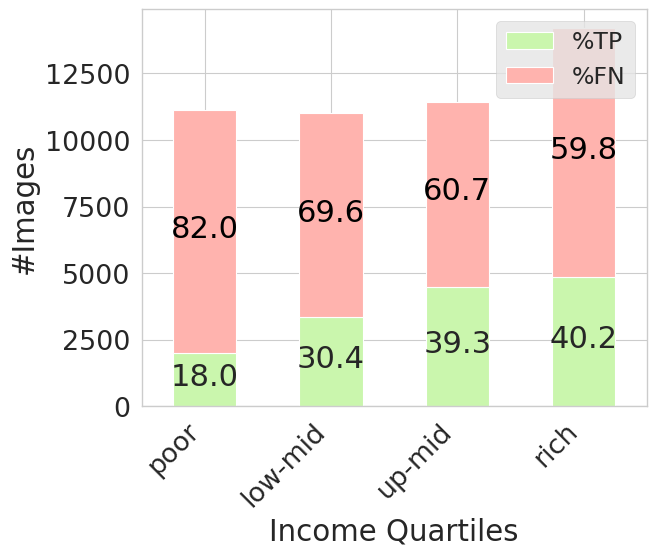

In [13]:
percentdata = {'Category': ['poor', 'low-mid', 'up-mid', 'rich'],
        'Value1': [18.0, 30.4, 39.3, 40.2],
        'Value2': [82.0, 69.6, 60.7, 59.8]}

pdata = {'Category': ['poor', 'low-mid', 'up-mid', 'rich'],
        'Recognized': [1999, 3342, 4495, 4847],
        'Forgotten': [9120, 7655, 6951, 9349]}


df = pd.DataFrame(pdata)

# Set 'Category' as index
df = df.set_index('Category')

# Create the stacked bar plot
ax = df.plot.bar(stacked=True, figsize=(7, 6), color = ['#CAF6AD', '#FFB3AE'])
plt.style.use('ggplot')
# Add labels and title
plt.xlabel("Income Quartiles")
plt.ylabel("#Images")
#plt.title("Stacked Bar Chart")


label_list1 = [18.0, 30.4, 39.3, 40.2]
label_list2 = [82.0, 69.6, 60.7, 59.8]

ax.bar_label(ax.containers[0], labels=label_list1, label_type='center', padding=2, size = 22)
ax.bar_label(ax.containers[1], labels=label_list2, color='black', label_type='center', padding=2, size = 22)



ax.legend(['%TP', '%FN'], loc='upper right', prop = {"size": 17}) #recognized, forgotten
sns.set_theme(style='whitegrid', context='paper', font_scale=2.2)



plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Show the plot

plt.savefig('top_function_Incomelevelall.pdf')
plt.savefig('top_function_Incomelevelall_function.png')
plt.show()

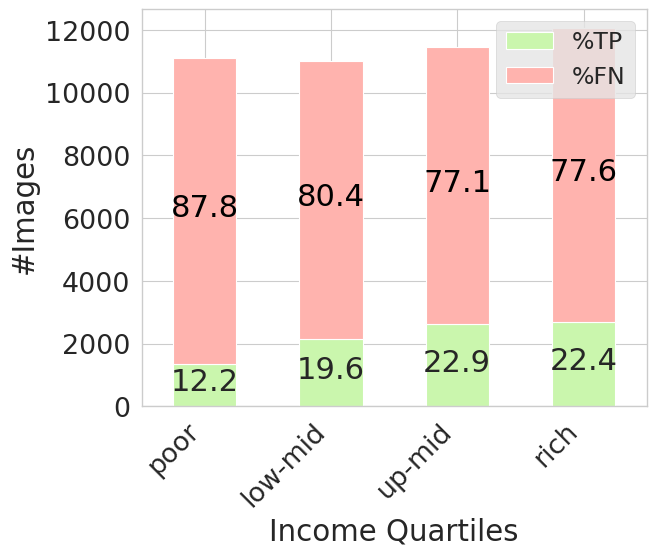

In [11]:
percentdata = {'Category': ['poor', 'low-mid', 'up-mid', 'rich'],
        'Value1': [12.2, 19.6, 22.9, 22.4],
        'Value2': [87.8, 80.4, 77.1, 77.6]}

pdata = {'Category': ['poor', 'low-mid', 'up-mid', 'rich'],
        'Recognized': [1358, 2156, 2620, 2705],
        'Forgotten': [9761, 8841, 8826, 9349]}


df = pd.DataFrame(pdata)

# Set 'Category' as index
df = df.set_index('Category')

# Create the stacked bar plot
ax = df.plot.bar(stacked=True, figsize=(7, 6), color = ['#CAF6AD', '#FFB3AE'])
plt.style.use('ggplot')
# Add labels and title
plt.xlabel("Income Quartiles")
plt.ylabel("#Images")
#plt.title("Stacked Bar Chart")


label_list1 = [12.2, 19.6, 22.9, 22.4]
label_list2 = [87.8, 80.4, 77.1, 77.6]

ax.bar_label(ax.containers[0], labels=label_list1, label_type='center', padding=2, size = 22)
ax.bar_label(ax.containers[1], labels=label_list2, color='black', label_type='center', padding=2, size = 22)

 

ax.legend(['%TP', '%FN'], loc='upper right', prop = {"size": 17}) #recognized, forgotten
sns.set_theme(style='whitegrid', context='paper', font_scale=2.2)



plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Show the plot

plt.savefig('function_Incomelevelall.pdf')
plt.savefig('function_Incomelevelall_function.png')
plt.show()

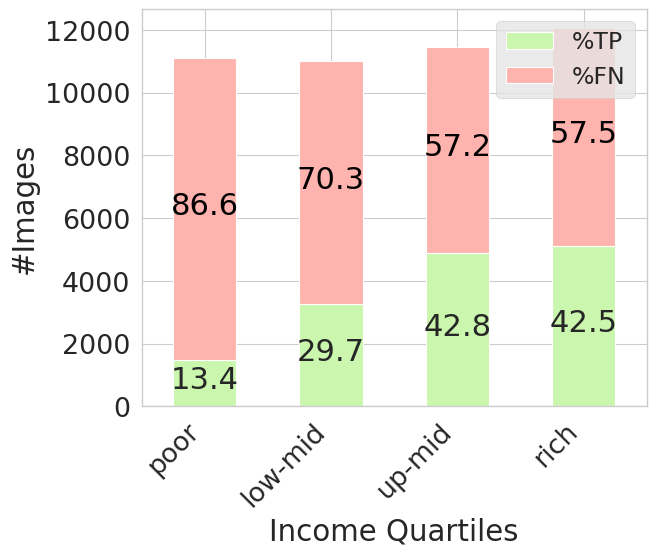

In [10]:
percentdata = {'Category': ['poor', 'low-mid', 'up-mid', 'rich'],
        'Value1': [13.4, 29.7, 42.8, 42.5],
        'Value2': [86.6, 70.3, 57.2, 57.5]}

pdata = {'Category': ['poor', 'low-mid', 'up-mid', 'rich'],
        'Recognized': [1491, 3271, 4899, 5121],
        'Forgotten': [9627, 7726, 6547, 6933]}


df = pd.DataFrame(pdata)

# Set 'Category' as index
df = df.set_index('Category')

# Create the stacked bar plot
ax = df.plot.bar(stacked=True, figsize=(7, 6), color = ['#CAF6AD', '#FFB3AE'])
plt.style.use('ggplot')
# Add labels and title
plt.xlabel("Income Quartiles")
plt.ylabel("#Images")
#plt.title("Stacked Bar Chart")


label_list1 = [13.4, 29.7, 42.8, 42.5]
label_list2 = [86.6, 70.3, 57.2, 57.5]

ax.bar_label(ax.containers[0], labels=label_list1, label_type='center', padding=2, size = 22)
ax.bar_label(ax.containers[1], labels=label_list2, color='black', label_type='center', padding=2, size = 22)



ax.legend(['%TP', '%FN'], loc='upper right', prop = {"size": 17}) #recognized, forgotten
sns.set_theme(style='whitegrid', context='paper', font_scale=2.2)



plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Show the plot

plt.savefig('topic_Incomelevelall.pdf')
plt.savefig('topic_Incomelevelall.png')
plt.show()

## Topic wise Functions

In [61]:
# map each image to corresponding topics, countries, income level ... TODO
dict_img2topic, dict_img2country, dict_img2incomelevel, dict_country2region = {}, {}, {}, {}
for list_topics, image_path, country, incomelevel, region in zip(data['topics'], data['imageRelPath'], data['country.name'], data['quartile'], data['region.id']):
    dict_img2topic[image_path] = list_topics
    dict_img2country[image_path] = country
    dict_img2incomelevel[image_path] = incomelevel
    dict_country2region[country] = region

print(len(dict_img2topic))

36754


In [65]:
#dict_function2FNimg =dict_topic2FNimg 

In [66]:
dict_topic2FNimg = {}

for key, value in topic2function.items():
    dict_topic2FNimg[key] = dict_function2FNimg[value]

In [67]:
list_all_incomelevelsGT = []
dict_topic2GTIncomelevels = {}
dict_all_incomelevels_GT = {}
for topic in dict_topic2img:
    list_imagesGT = dict_topic2img[topic]
    list_incomelevelsGT = [dict_img2incomelevel[img] for img in list_imagesGT]
    for incomelevel in list_incomelevelsGT:### Topics where Poor has higher Recall than other classes (Appendix)
        list_all_incomelevelsGT.append(incomelevel)
    #print(f"topic: {topic}; {Counter(list_countriesFN)}")
    dict_topic2GTIncomelevels[topic] = Counter(list_incomelevelsGT)
    
#print(f"ALL topics: {Counter(list_all_incomelevelsGT)}")
dict_all_incomelevels_GT = Counter(list_all_incomelevelsGT)

In [84]:
dict_topic2GTrichvspoor = {}
for topic, values in dict_topic2GTIncomelevels.items():
    temp_dict = {}
    temp_dict['low'] = values['poor'] + values['lower-middle']
    temp_dict['high'] = values['rich'] + values['upper-middle']
    
    dict_topic2GTrichvspoor[topic] = temp_dict
len(dict_topic2GTrichvspoor)

270

In [81]:
#dict_topic2FNIncomelevels['family snapshots']['poor']

In [68]:
list_all_incomelevelsFN = []
dict_topic2FNIncomelevels = {}
dict_all_incomelevels_FN = {}
for topic in dict_topic2FNimg:
    list_imagesFN = dict_topic2FNimg[topic]
    list_incomelevelsFN = [dict_img2incomelevel[img] for img in list_imagesFN]
    for incomelevel in list_incomelevelsFN:
        list_all_incomelevelsFN.append(incomelevel)
    #print(f"topic: {topic}; {Counter(list_countriesFN)}")
    dict_topic2FNIncomelevels[topic] = Counter(list_incomelevelsFN)
    
#print(f"ALL topics: {Counter(list_all_incomelevelsFN)}")
dict_all_incomelevels_FN = Counter(list_all_incomelevelsFN)

In [83]:
dict_topic2FNrichvspoor = {}
for topic, values in dict_topic2FNIncomelevels.items():
    temp_dict = {}
    temp_dict['low'] = values['poor'] + values['lower-middle']
    temp_dict['high'] = values['rich'] + values['upper-middle']
    
    dict_topic2FNrichvspoor[topic] = temp_dict
len(dict_topic2FNrichvspoor)

270

In [85]:
Recall_perincomelevel_pertopic = {}
for topic in dict_topic2FNrichvspoor:
    FN_counter_ = dict_topic2FNrichvspoor[topic]
    GT_counter_ = dict_topic2GTrichvspoor[topic]
        
    temp_recall_ratio_ = Counter({key : 1 - FN_counter_[key] / GT_counter_[key] for key in FN_counter_ if sum(GT_counter_.values()) * 0.01 <= GT_counter_[key] })
    Recall_perincomelevel_pertopic[topic] = temp_recall_ratio_

In [86]:
len(dict_topic2FNIncomelevels)

270

In [87]:
Recall_perincomelevel_pertopic

{'family snapshots': Counter({'low': 0.11627906976744184,
          'high': 0.3220338983050848}),
 'cutlery': Counter({'low': 0.3885350318471338, 'high': 0.5208333333333333}),
 'family': Counter({'low': 0.6312292358803987, 'high': 0.4838709677419355}),
 'place where eating dinner': Counter({'low': 0.029126213592232997,
          'high': 0.16860465116279066}),
 'plate of food': Counter({'low': 0.33333333333333337,
          'high': 0.47089947089947093}),
 'table with food': Counter({'low': 0.08849557522123896,
          'high': 0.040983606557377095}),
 'get water': Counter({'low': 0.07432432432432434,
          'high': 0.023809523809523836}),
 'stove/hob': Counter({'low': 0.24017467248908297,
          'high': 0.4741784037558685}),
 'light source in kitchen': Counter({'low': 0.11585365853658536,
          'high': 0.3310344827586207}),
 'drinking water': Counter({'low': 0.07999999999999996,
          'high': 0.16981132075471694}),
 'kitchen sink': Counter({'low': 0.05882352941176472,
   

In [88]:
t_list = list(Recall_perincomelevel_pertopic.keys())
function_high = [round(Recall_perincomelevel_pertopic[topic]['high'], 2) for topic in t_list]
function_low = [round(Recall_perincomelevel_pertopic[topic]['low'], 2) for topic in t_list]


topic_wise = pd.DataFrame()
topic_wise['topic'] = t_list
topic_wise['function_low'] = function_low
topic_wise['function_high'] = function_high

In [89]:
topic_wise.head()

,topic,function_low,function_high
0,family snapshots,0.12,0.32
1,cutlery,0.39,0.52
2,family,0.63,0.48
3,place where eating dinner,0.03,0.17
4,plate of food,0.33,0.47


In [90]:
topic_wise.to_csv('function_wise.csv')